# DepthAI Tutorial: Training an Object Detection Model with Your Own Data

<img src="https://docs.luxonis.com/images/depthai_logo.png" width="500">

Welcome to DepthAI! 

In this tutorial we will go through the basic training of an object detection model with your own annotated images.

The model you will use is a pretrained Mobilenet SSD v2 from the Tensorflow Object Detection API model zoo. The framework used for training is TensorFlow 1.15.2.
Will run through the following steps:


*   Install the libraries
*   Clone the github repo and replace the repo training data with your data from google drive
    (if you do not have own data, please see this
*   Train the model on the new images
*   Run inference on a few images to see what the model can detect
*   As an optional step, convert the model for OpenVINO inference

You can make a copy of this tutorial: File-> Save a copy in Drive

Note: the model training can be run with the repo images of three fruits if you choose to skip the part with loading your own images






# Install Libraries
# Press Shift+Enter to run cells
Some cells are commented out (all text is green), so they will not run the code inside.
To uncomment code inside a cell, select all the code then press 'Ctrl' + '/'

###After this cell executes runtime will restart to complete the install, ignore and close the message, continue running the cells below this one


In [ ]:
# %%capture
#After this cell executes runtime will restart to finish the install, ignore and close the crash message, continue running cells starting with the one below
!pip install numpy==1.17.5;
# !pip install tensorflow-gpu==1.14;
import os
# os.kill(os.getpid(), 9)

     |████████████████████████████████| 20.0MB 1.4MB/s 
ERROR: tensorflow 2.4.1 has requirement numpy~=1.19.2, but you'll have numpy 1.17.5 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5


In [ ]:
%tensorflow_version 1.x
!pip install tf_slim

TensorFlow 1.x selected.
     |████████████████████████████████| 358kB 4.3MB/s 


In [ ]:
import tensorflow as tf
tf.__version__

'1.15.2'

In [ ]:
# For the fruit model included in the repo below we have 240 training images
# For faster training time, images should be resized to 300x300 and then annotated
# Images should contain the objects of interest at various scales, angles, lighting conditions, locations
# For acceptable results - mAP@0.5 of 0.9 the model was trained with batch size of 24
# and 5000 steps. this takes about 1h using 2 augmentations. 
# using 5 augmentations it takes about 2h 
num_steps = 5000  # A step means using a single batch of data. larger batch, less steps required
#Number of evaluation steps.
num_eval_steps = 50
#Batch size 24 is a setting that generally works well. can be changed higher or lower 
MODELS_CONFIG = {
        'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
        'pipeline_file': 'ssd_mobilenet_v2_coco.config',
        'batch_size': 24
    }
}
selected_model = 'ssd_mobilenet_v2'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Training batch size fits in Colab's GPU memory for selected model.
batch_size = MODELS_CONFIG[selected_model]['batch_size']

### I have adapted the notebook for training on Medical Mask images.

## Clone the `test_object_detection_demo_flow` repository instead of the object_detection_demo_flow from the original notebook.

In [ ]:
#the data is in a different repository from the original custom demo training notebook
#so i am cloning the repo with my medical mask images
repo_url = 'https://github.com/GotG/test_object_detection_demo'
import os
%cd /content
repo_dir_path = os.path.abspath(os.path.join('.', os.path.basename(repo_url)))
!git clone {repo_url}
%cd {repo_dir_path}
!git pull

/content
Cloning into 'test_object_detection_demo'...
remote: Enumerating objects: 1747, done.
remote: Counting objects: 100% (1747/1747), done.
remote: Compressing objects: 100% (1525/1525), done.
remote: Total 36108 (delta 239), reused 1648 (delta 144), pack-reused 34361
Receiving objects: 100% (36108/36108), 1.36 GiB | 22.14 MiB/s, done.
Resolving deltas: 100% (12662/12662), done.
Checking out files: 100% (3592/3592), done.
/content/test_object_detection_demo
Already up to date.


#No need to connect gdrive since my data is in a github repo. so skip the optional section.

#[Optional] If you wish to use your own data from gdrive, run the cells below.
(Otherwise the model can train with the data already present in the cloned repo)

In [ ]:
#mount your google drive.
#it will be visible in the file navigator on the left of this notebook
#there should be a folder in your drive with your data
from google.colab import drive
drive.mount('/content/gdrive')

Own data should be split into 80% training (train folder), 20% for validation (test folder). The train and test folder should contain images and associated .xml annotations. 

Have extra images for final model testing (final_test folder). These need not be annotated.


In [ ]:
#To train on your own data:
#Remove repo data (images) for training/testing/final testing
!rm -r /content/object_detection_demo_flow/data/images/final_test/
!rm -r /content/object_detection_demo_flow/data/images/train/
!rm -r /content/object_detection_demo_flow/data/images/test/

In [ ]:
#copy files from gdrive to colab drive. this takes a few minutes, depending on the number of files.
#Go on the file explorer on the left of this notebook and access your gdrive. find the folders
#with your train, test and final_test images.
#Right click on each and copy the path. paste it btw the first " " in the corresponding lines  

#training folder
!cp -r "/content/gdrive/My Drive/data/3fruit/train_fruit/" "/content/object_detection_demo_flow/data/images/train"
#testing folder
!cp -r "/content/gdrive/My Drive/data/3fruit/test_fruit/" "/content/object_detection_demo_flow/data/images/test"
#final testing folder
!cp -r "/content/gdrive/My Drive/data/3fruit/final_test_fruit/" "/content/object_detection_demo_flow/data/images/final_test"

In [ ]:
# quick check for training data files. you can also browse to the object_detection_demo_flows
# on the left and see if they were copied
!ls /content/test_object_detection_demo/data/images/train

# Install Tensorflow Object Detection API
Clone TF models which contains the Object Detection API; also install the required dependencies


In [ ]:
%%capture
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git
%cd /content/models/
!git checkout 58d19c67e1d30d905dd5c6e5092348658fed80af
!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk
!pip install -q Cython contextlib2 pillow lxml matplotlib
!pip install -q pycocotools
%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.
import os
os.environ['PYTHONPATH'] += ':/content/models/research/:/content/models/research/slim/'
!python object_detection/builders/model_builder_test.py

## Prepare `tfrecord` files



In [ ]:
# %%capture
%%time
%cd {repo_dir_path}

# child index out of range fix in xml_to_csv.py
                # member[0].text,
                # int(member[5][0].text),
                # int(member[5][1].text),
                # int(member[5][2].text),
                # int(member[5][3].text),

# Convert train folder annotation xml files to a single csv file,
# generate the `label_map.pbtxt` file to `data/` directory as well.
!python xml_to_csv.py -i data/medmask_voc/train -o data/medmask_voc/annotations/train_labels.csv -l data/medmask_voc/annotations

# Convert test folder annotation xml files to a single csv.
!python xml_to_csv.py -i data/medmask_voc/test -o data/medmask_voc/annotations/test_labels.csv

# Generate `train.record`
!python generate_tfrecord.py --csv_input=data/medmask_voc/annotations/train_labels.csv --output_path=data/medmask_voc/annotations/train.record --img_path=data/medmask_voc/train --label_map data/medmask_voc/annotations/label_map.pbtxt

# Generate `test.record`
!python generate_tfrecord.py --csv_input=data/medmask_voc/annotations/test_labels.csv --output_path=data/medmask_voc/annotations/test.record --img_path=data/medmask_voc/test --label_map data/medmask_voc/annotations/label_map.pbtxt

# Set the paths
test_record_fname = '/content/test_object_detection_demo/data/medmask_voc/annotations/test.record'
train_record_fname = '/content/test_object_detection_demo/data/medmask_voc/annotations/train.record'
label_map_pbtxt_fname = '/content/test_object_detection_demo/data/medmask_voc/annotations/label_map.pbtxt'

/content/test_object_detection_demo
Successfully converted xml to csv.
Generate `data/medmask_voc/annotations/label_map.pbtxt`
Successfully converted xml to csv.


W1112 15:39:30.603431 139739358656384 module_wrapper.py:139] From generate_tfrecord.py:107: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W1112 15:39:30.740118 139739358656384 module_wrapper.py:139] From generate_tfrecord.py:53: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/test_object_detection_demo/data/medmask_voc/annotations/train.record


W1112 15:39:34.356234 139686888679296 module_wrapper.py:139] From generate_tfrecord.py:107: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W1112 15:39:34.378450 139686888679296 module_wrapper.py:139] From generate_tfrecord.py:53: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successf

## Download the Mobilenet SSD v2 Model

In [ ]:
%cd /content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = MODEL + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
DEST_DIR = '/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(MODEL, DEST_DIR)
!echo {DEST_DIR}
!ls -alh {DEST_DIR}

/content/models/research
/content/models/research/pretrained_model
total 135M
drwxr-xr-x  3 345018 89939 4.0K Mar 30  2018 .
drwxr-xr-x 63 root   root  4.0K Nov 12 15:39 ..
-rw-r--r--  1 345018 89939   77 Mar 30  2018 checkpoint
-rw-r--r--  1 345018 89939  67M Mar 30  2018 frozen_inference_graph.pb
-rw-r--r--  1 345018 89939  65M Mar 30  2018 model.ckpt.data-00000-of-00001
-rw-r--r--  1 345018 89939  15K Mar 30  2018 model.ckpt.index
-rw-r--r--  1 345018 89939 3.4M Mar 30  2018 model.ckpt.meta
-rw-r--r--  1 345018 89939 4.2K Mar 30  2018 pipeline.config
drwxr-xr-x  3 345018 89939 4.0K Mar 30  2018 saved_model


In [ ]:
#TF pretrained model checkpoint
fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint

'/content/models/research/pretrained_model/model.ckpt'

## Configuring a Training Pipeline

In [ ]:
import os
pipeline_fname = os.path.join('/content/models/research/object_detection/samples/configs/', pipeline_file)

assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

## Using 10000 steps below, where 1 step = 1 batch
### also modifying the default config for my training dataset

In [ ]:
import re
iou_threshold = 0.5
num_steps = 10000
num_classes = get_num_classes(label_map_pbtxt_fname)
with open(pipeline_fname) as f:
    s = f.read()
with open(pipeline_fname, 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(train.record)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(val.record)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    # Set number of classes num_classes.
    s = re.sub('iou_threshold: [0-9].[0-9]+',
               'iou_threshold: {}'.format(iou_threshold), s)
    
    f.write(s)

In [ ]:
# #Have a look at the config file with various settings
# !cat {pipeline_fname}

In [ ]:
# #Sometimes the cell above does not work, so can try running this cell instead.
# #After running this cell click on the link in the output cell to open tensorboard
# #Tensoarboard will show you graphically different training parameters as the model is training
# #when training finishes after the set number of steps, tensorboard can be used to see a nice summary of the training process
# #Visuals will load in Tensorboard after the model has gone through a few hundred steps

# model_dir = 'training/'
# !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
# !unzip ngrok-stable-linux-amd64.zip
# LOG_DIR = model_dir
# get_ipython().system_raw(
#     'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
#     .format(LOG_DIR)
# )
# get_ipython().system_raw('./ngrok http 6006 &')
# ! curl -s http://localhost:4040/api/tunnels | python3 -c \
#     "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

# Train the model

##[Optional] The cell below adds Tensorboard visualization to the training process.


In [ ]:
model_dir = 'training/'
%load_ext tensorboard
%tensorboard --logdir model_dir

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 572), started 1:19:50 ago. (Use '!kill 572' to kill it.)

In [ ]:
model_dir = 'training/'
# Optionally remove content in output model directory for a fresh start.
# !rm -rf {model_dir}
os.makedirs(model_dir, exist_ok=True)
!python /content/models/research/object_detection/model_main.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --num_eval_steps=200

W1112 15:39:49.763883 140487481436032 model_lib.py:717] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting train_steps: 10000
I1112 15:39:49.764132 140487481436032 config_util.py:552] Maybe overwriting train_steps: 10000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1112 15:39:49.764250 140487481436032 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: 1
I1112 15:39:49.764383 140487481436032 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: 1
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1112 15:39:49.764489 140487481436032 config_util.py:552] Maybe overwriting eval_num_epochs: 1
INFO:tensorflow:Maybe overwriting load_pretrained: True
I1112 15:39:49.764569 140487481436032 config_util.py:552] Maybe overwriting load_pretrained: True
INFO:tensorflow:Ignoring config override key: load_pretrained
I1112 15:39:49.764645 140487481436032 config_util.py

In [ ]:
#model dir check for the trained model
!ls {model_dir}

checkpoint
eval_0
events.out.tfevents.1605195609.ab1060eb5139
export
graph.pbtxt
model.ckpt-10000.data-00000-of-00001
model.ckpt-10000.index
model.ckpt-10000.meta
model.ckpt-5070.data-00000-of-00001
model.ckpt-5070.index
model.ckpt-5070.meta
model.ckpt-6339.data-00000-of-00001
model.ckpt-6339.index
model.ckpt-6339.meta
model.ckpt-7623.data-00000-of-00001
model.ckpt-7623.index
model.ckpt-7623.meta
model.ckpt-8912.data-00000-of-00001
model.ckpt-8912.index
model.ckpt-8912.meta


## Export a Trained Inference Graph
Once your training job is complete, you need to extract the newly trained inference graph, which will be later used to perform the object detection. This can be done as follows:

In [ ]:
#clean output_directory if necessary to start fresh:

# !rm -rf /content/object_detection_demo/fine_tuned_model/ 
# os.makedirs('/content/object_detection_demo_flow/fine_tuned_model/', exist_ok=True)

In [ ]:
%%capture
import re
import numpy as np

output_directory = './fine_tuned_model'
# output_directory = '/content/gdrive/My\ Drive/data/'

lst = os.listdir(model_dir)
lst = [l for l in lst if 'model.ckpt-' in l and '.meta' in l]
steps=np.array([int(re.findall('\d+', l)[0]) for l in lst])
last_model = lst[steps.argmax()].replace('.meta', '')

last_model_path = os.path.join(model_dir, last_model)
print(last_model_path)
!python /content/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path={pipeline_fname} \
    --output_directory={output_directory} \
    --trained_checkpoint_prefix={last_model_path}

In [ ]:
#export directory check
# !ls {output_directory}

In [ ]:
import os
pb_fname = os.path.join(os.path.abspath(output_directory), "frozen_inference_graph.pb")
assert os.path.isfile(pb_fname), '`{}` not exist'.format(pb_fname)
# !ls -alh {pb_fname}

## Running Inference: Checking what the trained model can detect
Test with images in repository `object_detection_demo_flow/data/images/final test` directory.

In [ ]:
import os
import glob

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = pb_fname

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = label_map_pbtxt_fname

# If you want to test the code with your images, just add images files to the PATH_TO_TEST_IMAGES_DIR.
PATH_TO_TEST_IMAGES_DIR =  os.path.join(repo_dir_path, "data/medmask_voc/final_test")

assert os.path.isfile(pb_fname)
assert os.path.isfile(PATH_TO_LABELS)
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*.*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)

['/content/test_object_detection_demo/data/medmask_voc/final_test/0029.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0033.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0015.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0025.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0028.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0031.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0022.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0027.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0035.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0020.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0030.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0018.jpg', '/content/test_object_detection_demo/data/medmask_voc/final_test/0017.jpg', '/content/t

/content/models/research/object_detection
/content/test_object_detection_demo/data/medmask_voc/final_test/0029.jpg


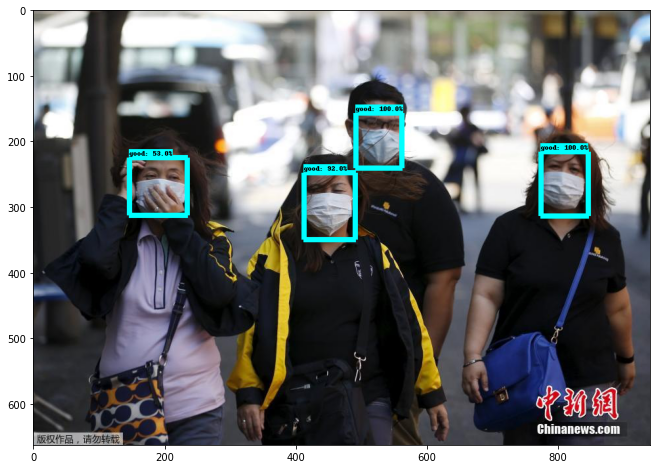

/content/test_object_detection_demo/data/medmask_voc/final_test/0033.jpg


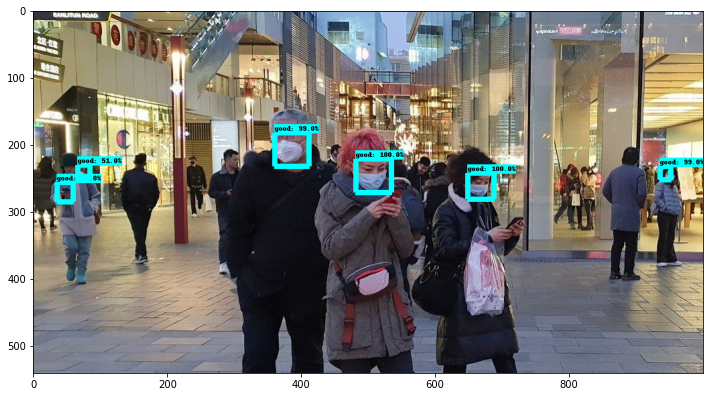

/content/test_object_detection_demo/data/medmask_voc/final_test/0015.jpg


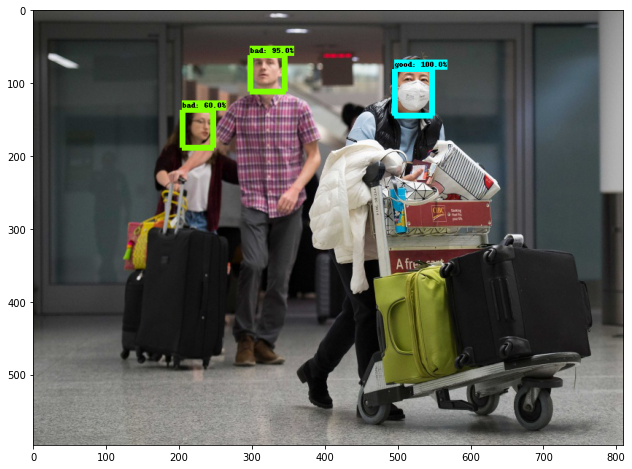

/content/test_object_detection_demo/data/medmask_voc/final_test/0025.jpg


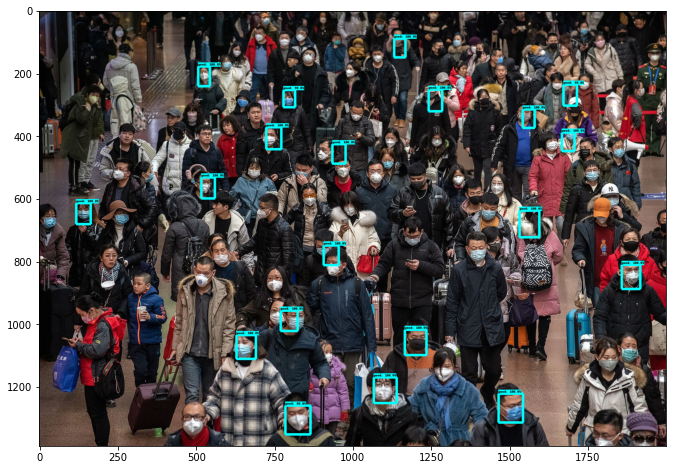

/content/test_object_detection_demo/data/medmask_voc/final_test/0028.jpg


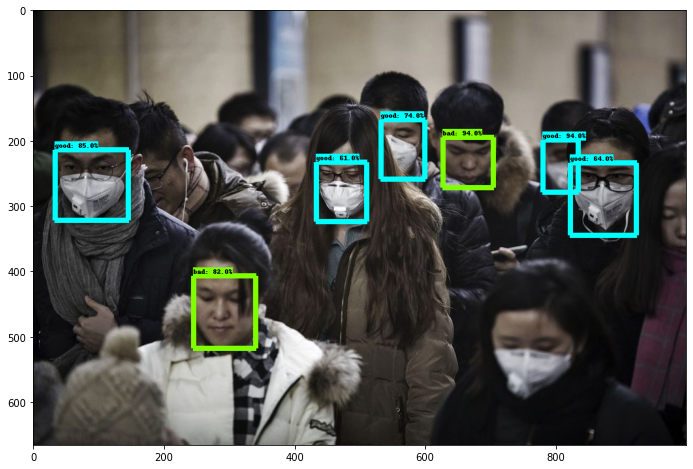

/content/test_object_detection_demo/data/medmask_voc/final_test/0031.jpg


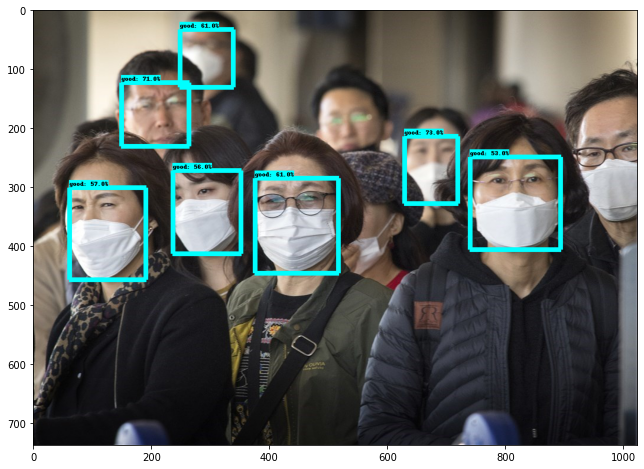

/content/test_object_detection_demo/data/medmask_voc/final_test/0022.jpg


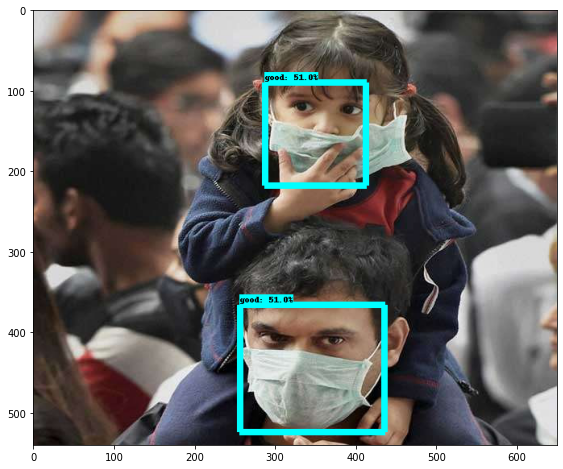

/content/test_object_detection_demo/data/medmask_voc/final_test/0027.jpg


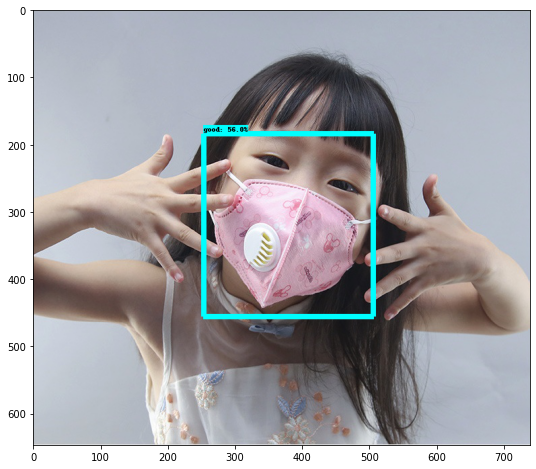

/content/test_object_detection_demo/data/medmask_voc/final_test/0035.jpg


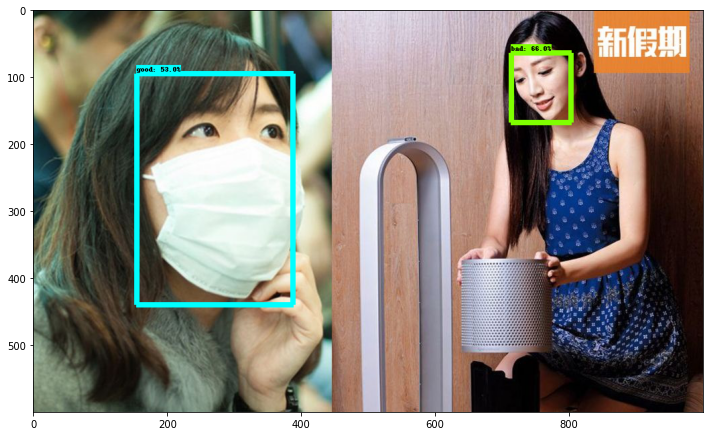

/content/test_object_detection_demo/data/medmask_voc/final_test/0020.jpg


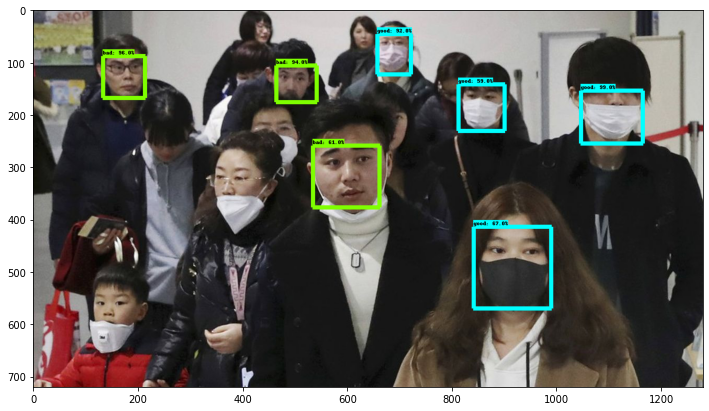

/content/test_object_detection_demo/data/medmask_voc/final_test/0030.jpg


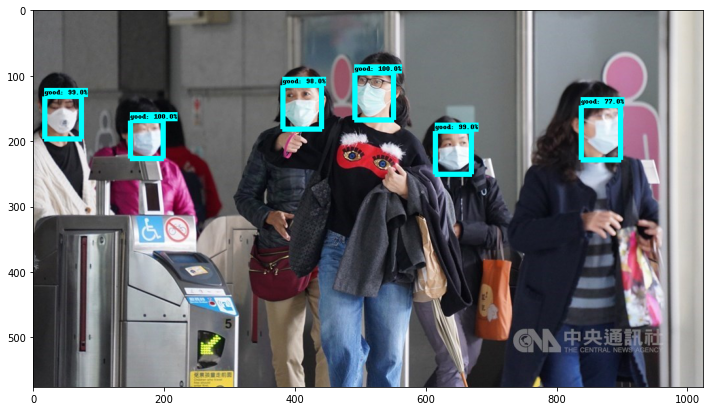

/content/test_object_detection_demo/data/medmask_voc/final_test/0018.jpg


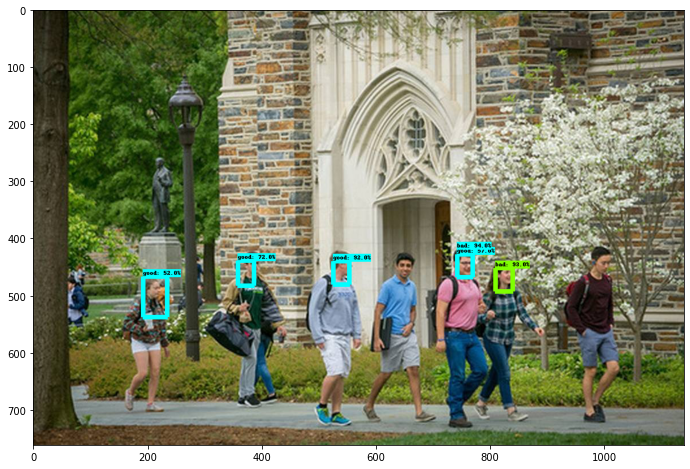

/content/test_object_detection_demo/data/medmask_voc/final_test/0017.jpg


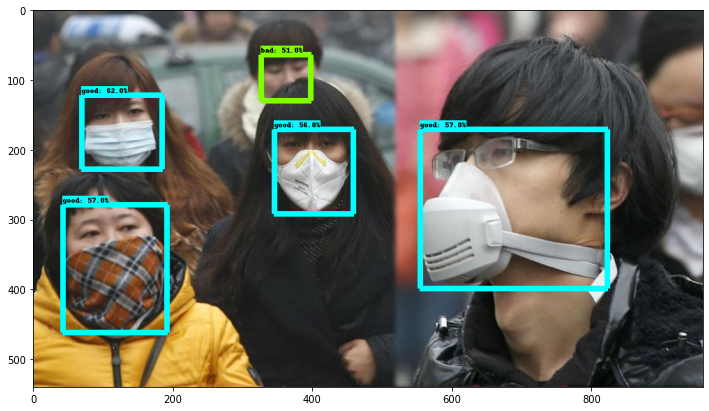

/content/test_object_detection_demo/data/medmask_voc/final_test/0026.jpg


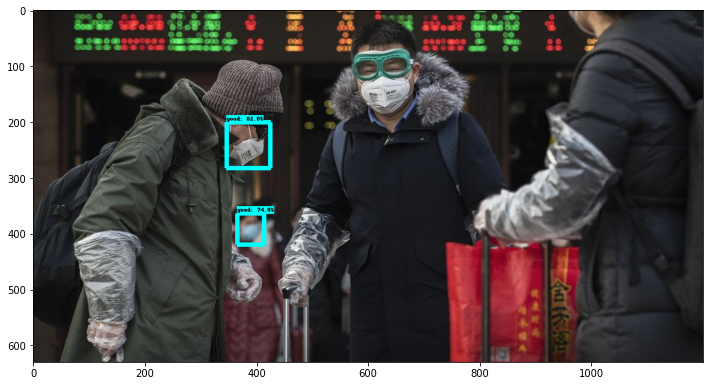

/content/test_object_detection_demo/data/medmask_voc/final_test/0034.jpg


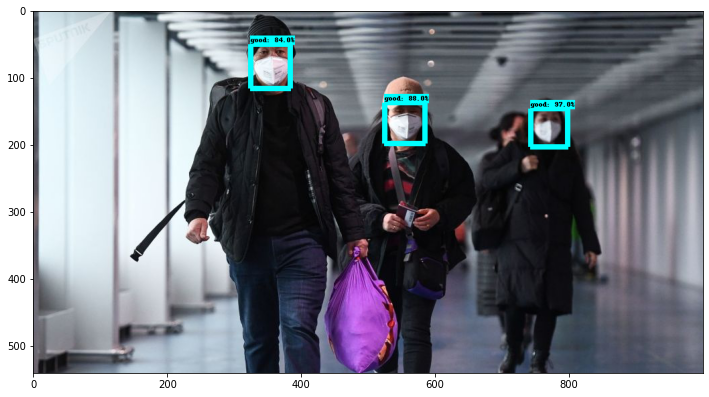

/content/test_object_detection_demo/data/medmask_voc/final_test/0019.jpg


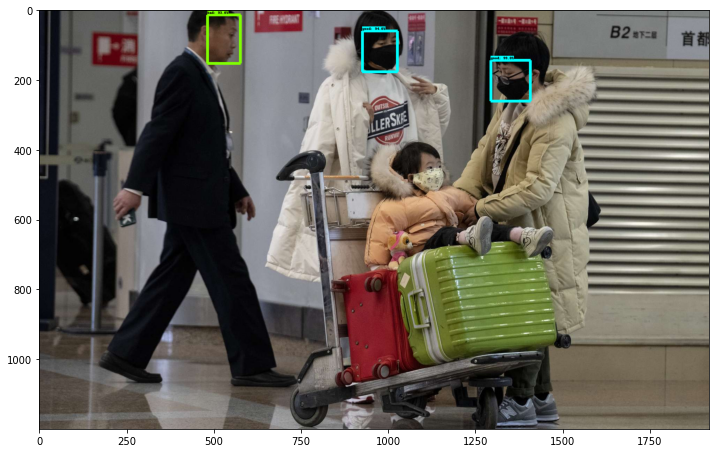

/content/test_object_detection_demo/data/medmask_voc/final_test/0023.jpg


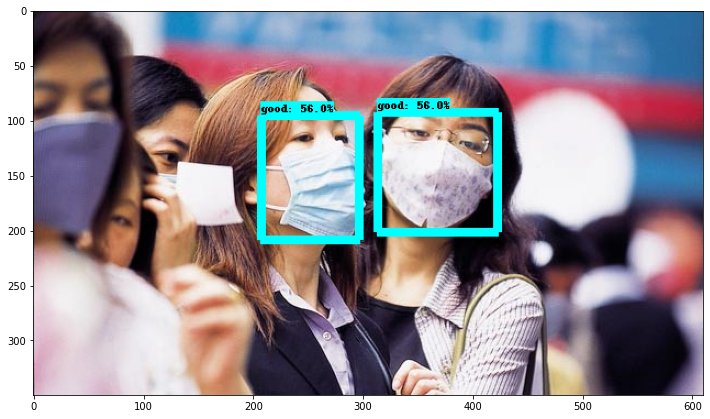

/content/test_object_detection_demo/data/medmask_voc/final_test/0021.jpg


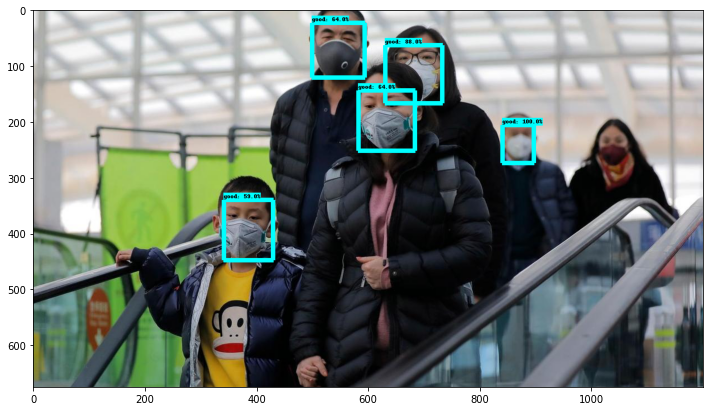

/content/test_object_detection_demo/data/medmask_voc/final_test/0037.jpg


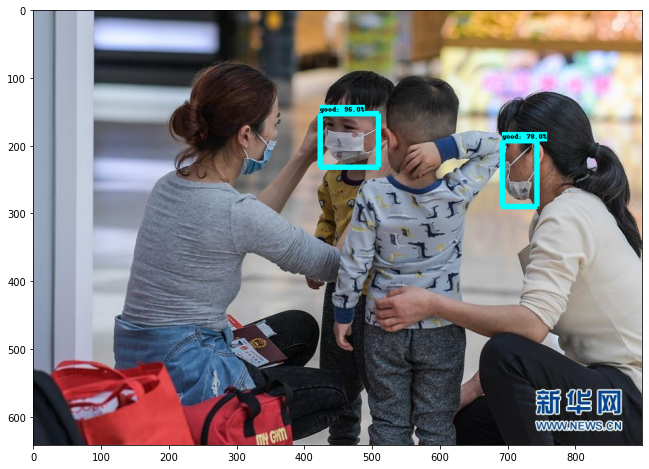

/content/test_object_detection_demo/data/medmask_voc/final_test/0024.jpg


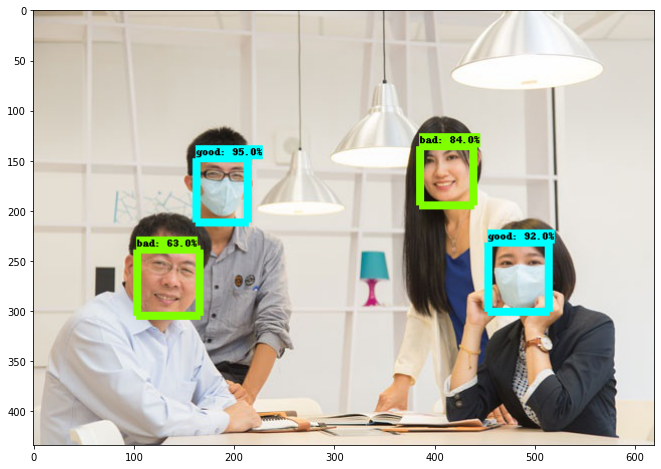

/content/test_object_detection_demo/data/medmask_voc/final_test/0032.jpg


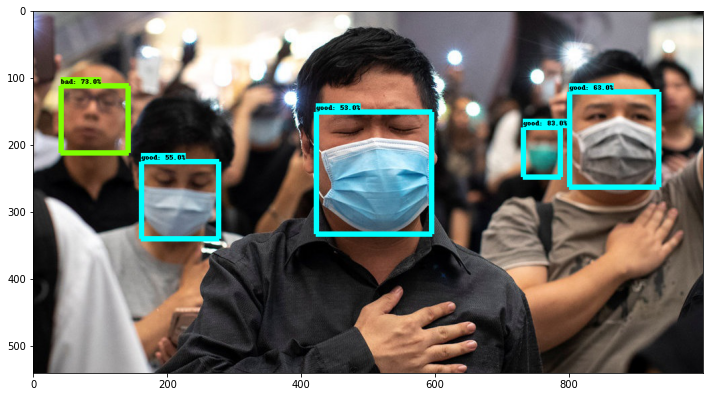

/content/test_object_detection_demo/data/medmask_voc/final_test/0016.jpg


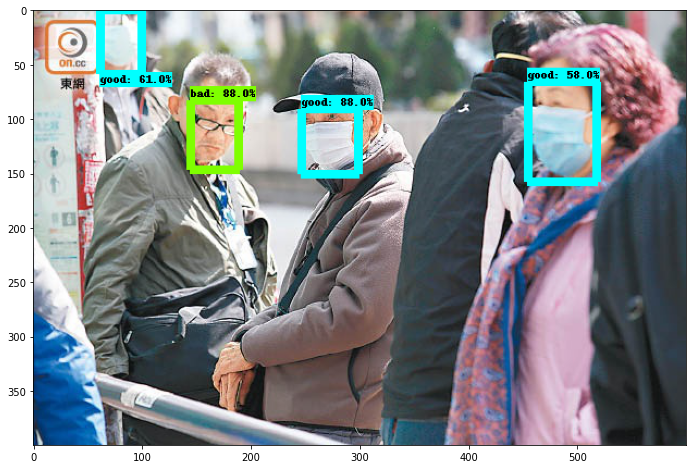

/content/test_object_detection_demo/data/medmask_voc/final_test/0036.jpg


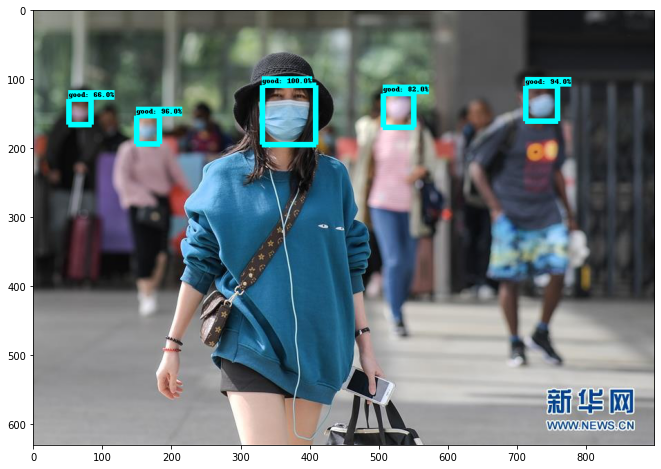

/content/test_object_detection_demo/data/medmask_voc/final_test/0014.jpg


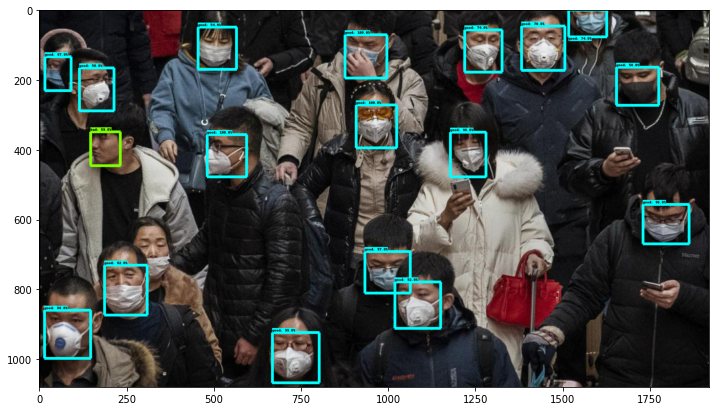

In [ ]:
%cd /content/models/research/object_detection

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
# This is needed to display the images.
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops

from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util


detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')


label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(
    label_map, max_num_classes=num_classes, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)


def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Get handles to input and output tensors
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {
                output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [
                'num_detections', 'detection_boxes', 'detection_scores',
                'detection_classes', 'detection_masks'
            ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
                        tensor_name)
            if 'detection_masks' in tensor_dict:
                # The following processing is only for single image
                detection_boxes = tf.squeeze(
                    tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(
                    tensor_dict['detection_masks'], [0])
                # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
                real_num_detection = tf.cast(
                    tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [
                                           real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [
                                           real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.5), tf.uint8)
                # Follow the convention by adding back the batch dimension
                tensor_dict['detection_masks'] = tf.expand_dims(
                    detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict,
                                   feed_dict={image_tensor: np.expand_dims(image, 0)})

            # all outputs are float32 numpy arrays, so convert types as appropriate
            output_dict['num_detections'] = int(
                output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict[
                'detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict


for image_path in TEST_IMAGE_PATHS:
    image = Image.open(image_path)
    print(image_path)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks'),
        use_normalized_coordinates=True,
        line_thickness=8)
    plt.figure(figsize=IMAGE_SIZE)
    plt.imshow(image_np)
    plt.show()
#if no images displayed, run this cell again

# Convert TF model to OpenVINO 20.01 Intermediate Representation (IR)

This can be used to run inference on OpenVINO.
# In order to run the model on DepthAI modules, we then compile the IR obtained above to a .blob (via a server we set up just for that)



#Install OpenVINO 20.01

In [ ]:
%%time
%%capture
## install tools. Open Vino takes some time to download: 10-15 min sometimes.
!sudo apt-get install -y pciutils cpio
!sudo apt autoremove
## downnload installation files
!wget http://registrationcenter-download.intel.com/akdlm/irc_nas/16345/l_openvino_toolkit_p_2020.1.023.tgz
path = "l_openvino_toolkit_p_2020.1.023.tgz"
# path = "/content/software/Intel OpenVINO 2019 R3.1/l_openvino_toolkit_p_2019.3.376.tgz"
## install openvino
!tar xf "{path}"
# !tar xf "{path}" && \
#     cd l_openvino_toolkit_p* && \
#     ./install_openvino_dependencies.sh && \
#     sed -i 's/decline/accept/g' silent.cfg && \
#     ./install.sh
# ## install dependencies
# !/opt/intel/openvino/install_dependencies/install_openvino_dependencies.sh
# ## install prerequisites
# !/opt/intel/openvino/deployment_tools/model_optimizer/install_prerequisites/install_prerequisites.sh

CPU times: user 114 ms, sys: 142 ms, total: 257 ms
Wall time: 35.8 s


In [ ]:
%%capture
%cd l_openvino_toolkit_p_2020.1.023/
!./install_openvino_dependencies.sh && \
    sed -i 's/decline/accept/g' silent.cfg && \
    ./install.sh --silent silent.cfg

Open Vino install check

In [ ]:
# !source /opt/intel/openvino/bin/setupvars.sh && \
#     /opt/intel/openvino/deployment_tools/demo/demo_squeezenet_download_convert_run.sh

In [ ]:
%cd /opt/intel/openvino/deployment_tools/model_optimizer/extensions/front/tf/
#openvino fixes: edit 
# Read in the file, make sure the .json corresponds to the model!!!
with open('ssd_v2_support.json', 'r') as file :
  filedata = file.read()

# Replace the target string
filedata = filedata.replace('"Postprocessor/ToFloat"', '"Postprocessor/Cast_1"')

# Write the file out again
with open('ssd_v2_support.json', 'w') as file:
  file.write(filedata)


/opt/intel/openvino_2020.1.023/deployment_tools/model_optimizer/extensions/front/tf


## Convert TF model to Open Vino Intermediate Representation
If using own model, please change to your desired name for output directory --output_dir "choose name"

#According to instructions, the output_dir name is changed to the relevant: medmask_IRv10_10k. I like to use the number of steps trained in the file name.

In [ ]:
#CONVERT TF MODEL to OPEN VINO IRv10. saved in IRv10 directory or choose name
%cd "/content/models/research/fine_tuned_model/"
!source /opt/intel/openvino/bin/setupvars.sh && \
    python /opt/intel/openvino/deployment_tools/model_optimizer/mo.py \
    --input_model frozen_inference_graph.pb \
    --tensorflow_use_custom_operations_config /opt/intel/openvino/deployment_tools/model_optimizer/extensions/front/tf/ssd_v2_support.json \
    --tensorflow_object_detection_api_pipeline_config pipeline.config \
    --reverse_input_channels \
    --output_dir ./medmask_10k_2001 \
    --data_type FP16  
    

/content/models/research/fine_tuned_model
[setupvars.sh] OpenVINO environment initialized
[ WARNING ]  Use of deprecated cli option --tensorflow_use_custom_operations_config detected. Option use in the following releases will be fatal. Please use --transformations_config cli option instead
Model Optimizer arguments:
Common parameters:
	- Path to the Input Model: 	/content/models/research/fine_tuned_model/frozen_inference_graph.pb
	- Path for generated IR: 	/content/models/research/fine_tuned_model/./medmask_10k_2001
	- IR output name: 	frozen_inference_graph
	- Log level: 	ERROR
	- Batch: 	Not specified, inherited from the model
	- Input layers: 	Not specified, inherited from the model
	- Output layers: 	Not specified, inherited from the model
	- Input shapes: 	Not specified, inherited from the model
	- Mean values: 	Not specified
	- Scale values: 	Not specified
	- Scale factor: 	Not specified
	- Precision of IR: 	FP16
	- Enable fusing: 	True
	- Enable grouped convolutions fusing: 	Tru

In [ ]:
#check directory containing the exported TF trained model and the IRv10 folder
%ls 

## Now we compile the IR model to a .blob for use on DepthAI modules/platform

### We save the blob in the IR directory from above, corresponding to --output_dir parameter above. 
The blob filename will be *frozen_inference_graph.blob*

In [ ]:
#CHOOSE the directory where you would like to save the blob.
# I use the same --output_dir as above for the IR conversion
blob_dir = "/content/models/research/fine_tuned_model/medmask_IRv10_10k/"

#Copy the path of your .xml and .bin files. For that, you can look at the IR
#conversion output cell, select and copy from:
#[SUCCESS] XML file and bin file paths.
#Or you can choose to compile other .xml .bin files from a different location
#
xmlfile = "/content/models/research/fine_tuned_model/medmask_IRv10_10k/frozen_inference_graph.xml"
binfile = "/content/models/research/fine_tuned_model/medmask_IRv10_10k/frozen_inference_graph.bin"

import requests

#For openvino 20.01 use this link to compile the blobb
url = "http://69.164.214.171:8080"


#open vino 20.02 link:
# url = "69.164.214.171:8081"

payload = {'compiler_params': '-ip U8 -VPU_MYRIAD_PLATFORM VPU_MYRIAD_2480 -VPU_NUMBER_OF_SHAVES 4 -VPU_NUMBER_OF_CMX_SLICES 4'}
files = [
  ('definition', open(xmlfile,'rb')),
  ('weights', open(binfile,'rb'))
]
# headers = {
#   'Content-Type': 'application/json'
# }
response = requests.request("POST", url, data = payload, files = files)
blobnameraw = response.headers.get('Content-Disposition')
blobname = blobnameraw[blobnameraw.find('='):][1:]
with open(blob_dir + blobname, 'wb') as f:
  f.write(response.content)

##Now you can download your .blob file and run it on the DepthAI module/platform
To download locally, use the file explorer on the left to locate the file in the --output_dir folder, then right click download. Colab takes a few seconds to prepare the file, then the download prompt will appear.


## To run the .blob in DepthAI, follow the tutorial:
https://docs.luxonis.com/en/latest/pages/tutorials/hello_world/

##[Optional] to convert the blob locally, download the IR files .bin and .xml and follow these instructions: 
https://docs.luxonis.com/en/latest/pages/tutorials/local_convert_openvino/

In [ ]:
#Compress the folder with the Tensorflow model and OpenVINO IR_V10 folder and download it locally.
#These are in content/models/research/fine_tuned_model, so we compress the fine_tuned_model folder.
!tar cvf fine_tuned_model.tar.gz fine_tuned_model

tar: fine_tuned_model: Cannot stat: No such file or directory
tar: Exiting with failure status due to previous errors


In [ ]:
#download the compressed IRv10 folder locally
#or can use file navigator on the left to move it to your gdrive
from google.colab import files
files.download("fine_tuned_model.tar.gz")

In [ ]:
!zip -r medmask_10k_OV2001 /content/models/research/fine_tuned_model/medmask_10k_2001

updating: content/models/research/fine_tuned_model/medmask_10k_2001/ (stored 0%)
  adding: content/models/research/fine_tuned_model/medmask_10k_2001/frozen_inference_graph.mapping (deflated 94%)
  adding: content/models/research/fine_tuned_model/medmask_10k_2001/frozen_inference_graph.bin (deflated 7%)
  adding: content/models/research/fine_tuned_model/medmask_10k_2001/frozen_inference_graph.xml (deflated 94%)
